# A  brief look at Face Recognition using Python

In this notebook, I talk a little about the way face recognition algorithms work, and test out their principles on the `face-recognition` library in Python.

## Table of Contents

1. [Introduction](#introduction)
2. [Using the face-recognition package](#using-the-face-recognition-package)
3. [Final Thoughts](#final-thoughts)



------------
### Introduction

Face recognition is a computer vision problem that is generally solved in several different steps, and is more complex than regular object classification using convolutional neural networks. Basically, from an image or video containing a person you want an algorithm to locate and give back some information about their identity, like for example their name.

The parts involved in typical face recognition algorithms are:

1. **Face detection**: A machine learning model, typically a CNN, identifies that a face exists in an image or video, as well as its location and limits (bounding box).

2. **Landmark detection**: In this part, the most distinctive features that compose a face are identified and mapped on the already-identified face. Think of it as spatially-locating the eyes, nose, forehead, mouth and other significant parts of a face. This is also called face alignment.

3. **Face Representation**: With the mapping of the person's face landmarks, an algorithm extracts the key features that identify the face and stores it into an embedding. Even though the embedding makes sense only to the computer, a rough comparison is to think of the embeddings as storing measures that define a person's face, like the shape of their nose, the distance between their eyes, the size of their mouth, etc.

4. **Classification**: Now that the model has extracted the embeddings from the face in the image, what remains is to compare these embeddings to a database of face embeddings and person IDs (or names). The most similar embedding from the database is used for comparison, and an identity is assigned to the person if the embeddings similarity exceeds a given threshold.

-----------

### Using the `face-recognition` package

`face-recognition` is an easy-to-use and well-supported software we can run directly on Python, and that follows the principles I mentioned in the last section.

Some information about this library before we get started:

* It was built on top of `dlib`, an open-source C++ machine learning toolkit.

* To make face detection possible in different image conditions (brightness, definition, etc.), it relies on a method called **Histogram of Oriented Gradients** (HOG), which for each pixel in an image maps the direction in which the darkest pixel in a wider sub-region is found.

* For landmark detection, it uses a 5 or 68-point system. This information is then passed on through a deep residual network (“ResNet”) that maps the face to a 128-dimensional embedding.

* To map an embedding to an identity, it calculates the euclidean distance between the processed embedding and the stored embeddings. If the distance between the most similar embedding and the current embedding is smaller than a given threshold (typically 0.6), then it is matched to an identity.

* The model achieves a 99.38% accuracy on the [Labeled Faces in the Wild](https://www.kaggle.com/datasets/jessicali9530/lfw-dataset) benchmark, a commonly-used dataset for measuring performance for face recognition algorithms.

For more information about this package, I recommend the following sources:
* [PyPI landing](https://pypi.org/project/face-recognition/)
* [ReadtheDocs Landing](https://face-recognition.readthedocs.io/en/latest/history.html)
* [Official documentation](https://app.readthedocs.org/projects/face-recognition/downloads/pdf/latest/)
* [dlib's official page](https://dlib.net/)

Now that we know a little bit better the package we'll be working with, we can move on to testing its functionalities.


In [2]:
#!pip install face-recognition

**Warning**: To be able o use this library, you must already have the `dlib` and `cmake` dependencies installed in your machine. If running from Mac, I recommend using `homebrew` to manage these installations for greater ease of use.

Installation is a bit tricky on Windows system, and the Google Colab environment isn't well-suited for download either.

To facilitate the manipulation of images, and so we don't have to download them locally, we first introduce a function to load them from the internet.

In [45]:
import requests
import numpy as np
from PIL import Image
from io import BytesIO
from PIL import ImageFilter
import matplotlib.pyplot as plt


def download_image_from_web(
    url: str,
    display_image: bool = True,
    flip: bool = False,
    flip_angle: int = 180,
    blur: bool = False,
    blur_radius: int = 3
) -> np.ndarray:
    '''
    Downloads an image from the internet and saves it to a python object, in the
    form of a numpy array.

    Params
    ----------
        url
          the url to download the image from.
        display_image
            if True, print the image. Otherwise, only saves it.
        flip: bool, flip_angle: int
            if flip is True, flips the image by the specified angle.
        blur: bool, blur_radius: int
            if blur is True, blurs the image to reduce its quality a specified radius.
            The bigger the radius, the more blurred the image will be.
    '''
    # download image
    response = requests.get(url)
    image = Image.open(BytesIO(response.content)).convert('RGB')

    # flip image if requested
    if flip:
        image = image.rotate(flip_angle)

    # blur image if requested
    if blur:
        image = image.filter(ImageFilter.GaussianBlur(radius=blur_radius))

    image = np.array(image).astype(np.uint8)

    # display image
    if display_image:
        plt.figure(figsize=(4, 3))
        plt.imshow(image)
        plt.axis('off')
        plt.show()

    return image

We also define another function that will help us define the face recognition pipeline, given a set of input images and their respective labels in the form of a dictionary.

In [ ]:
import face_recognition
from PIL import ImageDraw, ImageFont


def recognize_faces(
    labeled_images: dict,
    target_image: np.ndarray,
    tolerance: float = 0.6
) -> None:
    """
  Takes as input a dictionary of labeled images, and a target image where the persons should 
  be identified, and displays an image with the results of the recognition process.

  Logic
  ----------
      1. For each labeled image, learn the face features and store them in a list.
      2. Locate all faces in the target image and generate their encodings.
      3. For each identified face, compare it with the learned faces to find matches. An identity is
         assigned if the learned encoding with the lowest euclidean distance to the current face
         is smaller than the specified tolerance.
      4. Draw bounding boxes around recognized faces and label them with names.
      5. Display the final annotated image.

  Input
  ----------
      labeled_images: dict
        a dictionary, where each key corresponds to a person's name, and each value corresponds to
        their base image, which the algorithm will use to learn their features. Each base image
        should only contain a single person for this to work correctly.
        e.g.,
          {
            'Bruce Wayne': image_of_bruce_wayne,
            'Clark Kent': image_of_clark_kent,
            ...
          }
      target_image: np.ndarray
          Target image where the person(s) from the previous inputs are to be identified and/or recognized. 
          In this instance, several or no persons may appear in the image.
      tolerance: float
        the threshold for defining if a face is a match or not, based on the euclidean distance
        between the two embeddings. An identity is assigned to the person if the distance between
        the most similar embedding and the current embedding is smaller than this threshold.

  Output
  ----------
          Displayed image with annotations showing the faces of each recognized person by name
          in the target image. Identified but unrecognized faces are labeled as "Unknown".
  """
    # loop the labeled_images, learn features and store to new objects (lists are easier)
    known_face_encodings = []
    known_face_names = []
    invalid_names = 0
    for key, value in labeled_images.items():
        face_encoding = face_recognition.face_encodings(value)[0]
        known_face_encodings.append(face_encoding)
        if isinstance(key, str) and len(key) > 0:
          known_face_names.append(key)
        else:
          print(f"Found an invalid key for person's name: {key}")
          known_face_names.append(f"Unnamed {invalid_names}")
          invalid_names += 1

    # locate all present faces in target image, and generate their encodings
    face_locations = face_recognition.face_locations(target_image)
    new_face_encodings = face_recognition.face_encodings(target_image, face_locations)

    # convert image to PIL to facilitate making annotations
    pil_image = Image.fromarray(target_image)
    draw = ImageDraw.Draw(pil_image)

    # loop each identified face in target image
    for (top, right, bottom, left), face_encoding in zip(face_locations, new_face_encodings):

        # check if the identified face matches any of the learned faces (returns a list of T/F values)
        matches = face_recognition.compare_faces(
            known_face_encodings,
            face_encoding,
            tolerance=tolerance
        )

        # select the known face with the shortest face distance to the new face
        face_distances = face_recognition.face_distance(
            known_face_encodings,
            face_encoding
        )
        best_match_index = np.argmin(face_distances)

        # evaluate if most similar face classifies as a match
        if matches[best_match_index]:
            name = known_face_names[best_match_index]
            print(f"Found a match for {name} with distance {round(face_distances[best_match_index], 3)}")
        else:
            name = "Unknown"

        # draw the face's bounding box
        draw.rectangle(((left, top), (right, bottom)), outline=(0, 0, 255))

        # write face name at the bottom of bounding box
        font = ImageFont.load_default()
        left_text, top_text, right_text, bottom_text = draw.textbbox((left, bottom), name, font=font)
        text_width = right_text - left_text
        text_height = bottom_text - top_text
        draw.rectangle(((left, bottom - text_height - 10), (right, bottom)), fill=(0, 0, 255), outline=(0, 0, 255))
        draw.text((left + 2, bottom - text_height - 5), name, fill=(255, 255, 255, 255))

    # display final image
    display(pil_image)

In order to get started, we'll be using images from professional footballers from Real Madrid CF. Let's get started with Federico Valverde, Kylian Mbappé and Thibaut Courtois:

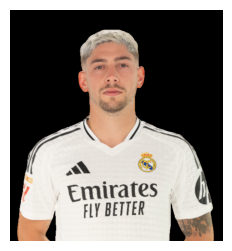

In [5]:
valverde_image = download_image_from_web(
    "https://assets.laliga.com/squad/2024/t186/p223255/1024x1113/p223255_t186_2024_1_001_000.png"
)

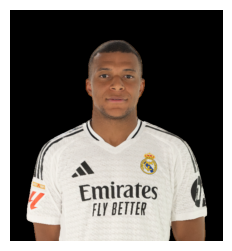

In [6]:
mbappe_image = download_image_from_web(
    "https://assets.laliga.com/squad/2024/t186/p220160/2048x2225/p220160_t186_2024_1_001_000.png"
)

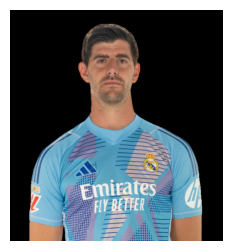

In [7]:
courtois_image = download_image_from_web(
    "https://assets.laliga.com/squad/2024/t186/p60772/2048x2225/p60772_t186_2024_1_001_000.png"
)

We now load a full-squad picture, which we'll use as target image, and attempt to recognize the faces therein.

Found a match for Courtois with distance 0.449
Found a match for Valverde with distance 0.435
Found a match for Mbappe with distance 0.493


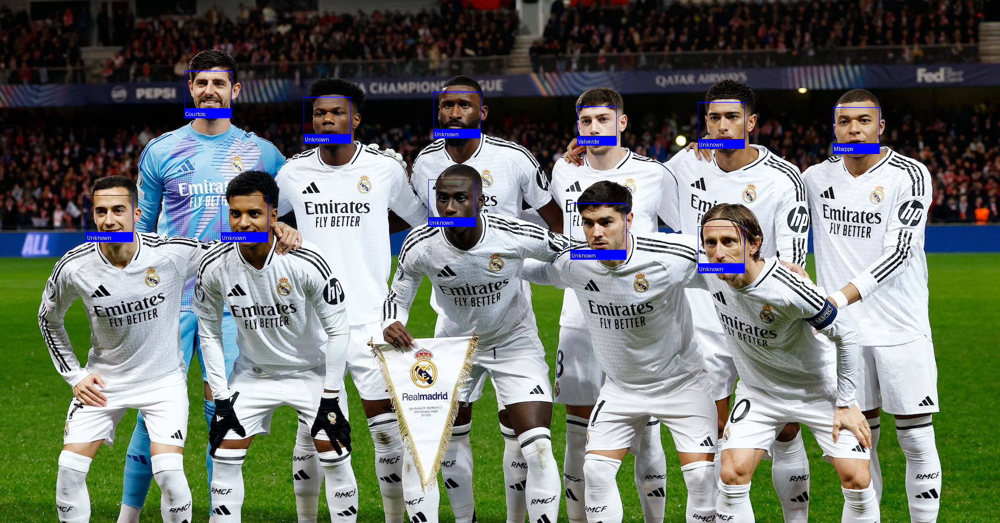

In [18]:
full_squad_picture = download_image_from_web(
    "https://www.reuters.com/resizer/v2/MYZNGKOMR5K5BKHN3HTB4Z3FT4.jpg?auth=4cae2255d22876cfda2cb325e205795c9e73eef26537654b6790d5f114577465&height=1005&width=1920&quality=80&smart=true",
    False
    )
player_images = {
    "Valverde": valverde_image,
    "Mbappe": mbappe_image,
    "Courtois": courtois_image
}
recognize_faces(player_images, full_squad_picture)

From this first approach, we can see that the library did a pretty good job. It identified all 11 faces from the players present in the picture, and it recognized the 3 players for which we saved the encodings: Courtuois (leftmost in the top row), Mbappe (rightmost in top row), and Valverde (fourth left-to-right in the top row).

We can also see that, of all of the faces, it had most trouble with Mbappe's face. Some sources report that many face recognition models have trouble with people of darker skin colors, and perhaps this is attributable to that.

However, this was still a relatively ease case for a model capable of scoring 99.38% in the LFiW dataset, and the next step for us will be to put it to the test with harder images to process.

#### Test 1: Contorted Faces

Let's test the model on an image of Valverde expressing his passion for the game:

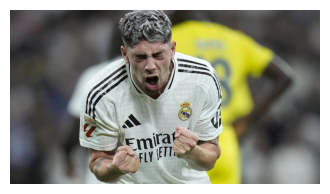

In [13]:
valverde_2 = download_image_from_web(
    "https://estaticos-cdn.prensaiberica.es/clip/bb98106b-ffa1-41e6-bfc1-10a4adb9c1e9_alta-libre-aspect-ratio_default_0.jpg"
)

Found a match for Valverde with distance 0.581


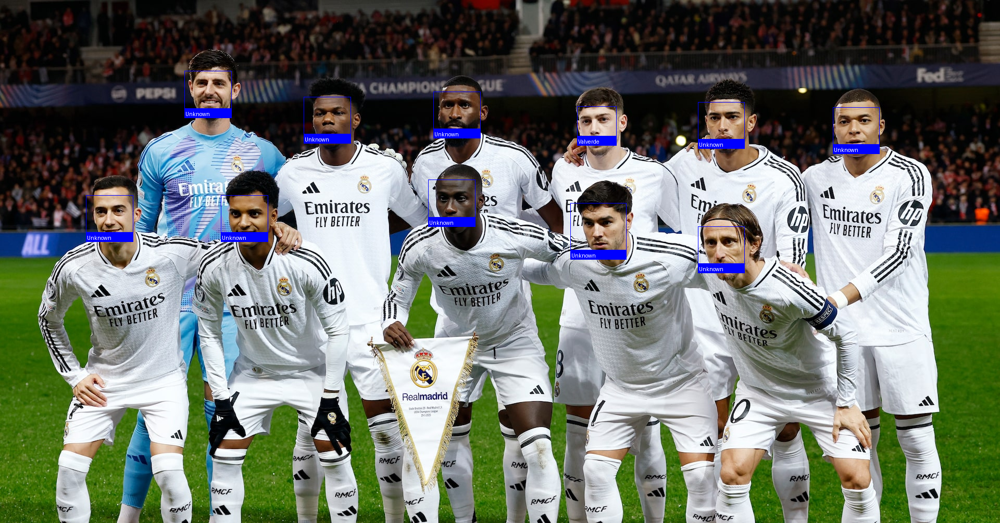

In [ ]:
images = {
    "Valverde": valverde_2
}
recognize_faces(images, full_squad_picture)

As we can see, the model managed to identify Valverde here too, but it closer to the confidence interval (0.6). In the first image he is seen with closed eyes and and a contorted face, whereas in the full squad picture he wears no expression on his face and appears serene.

#### Test 2: Incomplete faces

We now have Mbappé playing in the rain, with not-so-high visibility, taken from one side, and with a contorted face from the effort of the play. A rival defender is also in this picture.

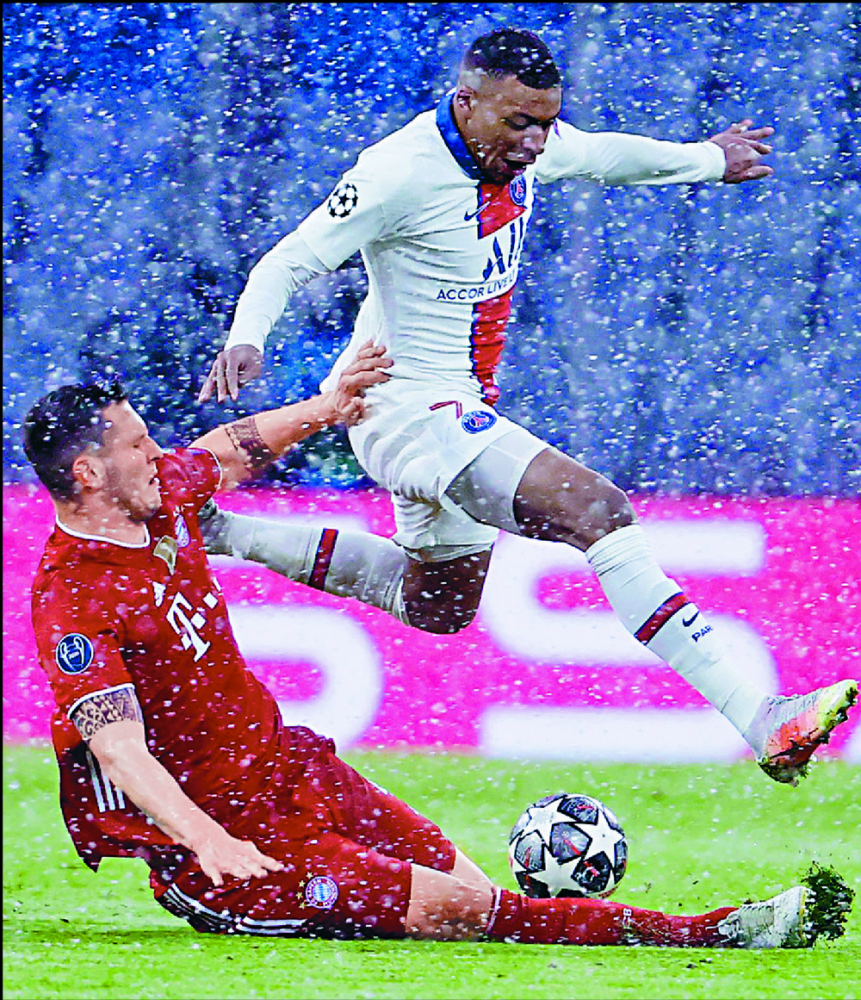

In [ ]:
mbappe_2 = download_image_from_web(
    "https://image.hkstandard.com.hk/f/1024p0/0x0/100/none/129527b747f3c49d0af35b6c01fd6f46/images/2021-04/50059654indexPhoto.jpg",
    False
)
images = {
    "Mbappe": mbappe_image
}
recognize_faces(images, mbappe_2)

As we can see, in this instance the model wasn't even able to identify the faces for the two people present in the image. This is probably due to the fact that neither of them is showing their complete face to the camera, and so it fails in the first step of the pipeline: face detection.

#### Test 3: Old vs young photos 

How well can the model do with two pictures of the same person separated by a considerable amount of time?


For this, we'll be using two pictures of Hollywood actor and director Clint Eastwood. I ignore how old he is in either of the photos, but the age difference is obvious at first glance. We'll save the encodings for the young version, and see if they can be mapped to the older one.

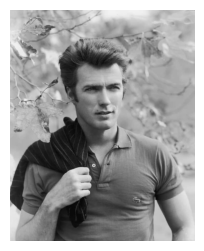

Found a match for Clint Eastwood with distance 0.665


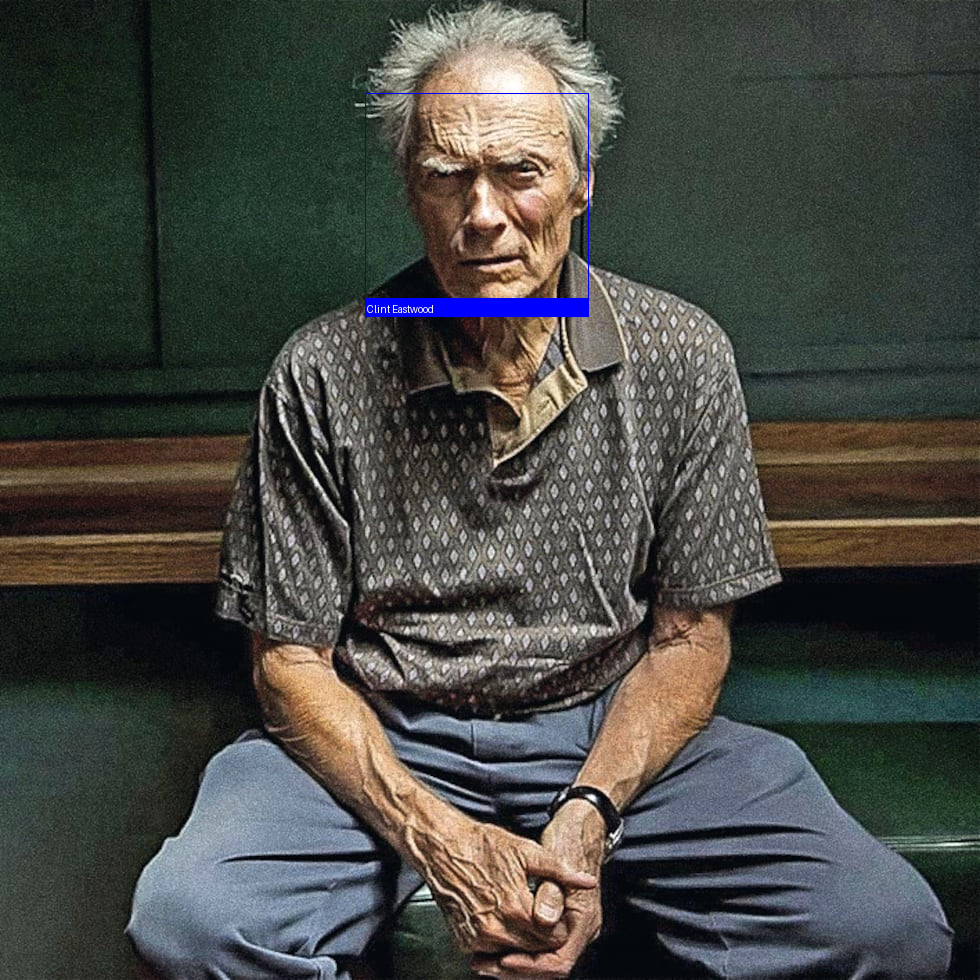

In [ ]:
eastwoood_young_image = download_image_from_web(
    "https://imgix.ranker.com/user_node_img/50026/1000514700/original/young-clint-eastwood-in-a-body-fit-shirt-photo-u1?auto=format&q=60&fit=crop&fm=pjpg&dpr=2&w=355",
)
eastwood_old_image = download_image_from_web(
    "https://imagenes.elpais.com/resizer/v2/QH7ST3OGWBB4JFHCH5HZYVWUNY.jpg?auth=12389fbdfafc929a66165e3d1f706093f784f283a8462197bf85767f052b029c&width=980&height=980&smart=true",
    False
)
images = {
    "Clint Eastwood": eastwoood_young_image
}
recognize_faces(images, eastwood_old_image, tolerance=0.7)

The model attributed the same identity of the young man to the picture of the older one, albeit with a rather low confidence threshold (high euclidean distance). 

A person who didn't know who Clint Eastwood was or what he looked like when he was young would surely have trouble telling straight away the two pictures contain the same person, or if they did, they'd have their doubts their effectively the same person, so we can cut the model some slack.

#### Test 4: Lookalikes

For this part, we can save the embeddings of the first person, and test if it recognizes those embeddings in the second one. It doesn't work if both are in the picture, because we set our function to take only the lowest face distance of all present.

We'll be using a picture on Michael Jordan, and a picture of Anthony Edwards, who looks kind of alike to Michael (both are great players!).

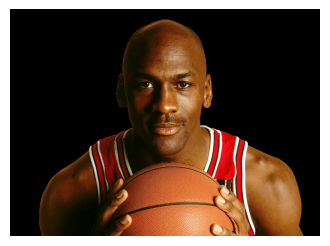

Found a match for Michael Jordan with distance 0.576


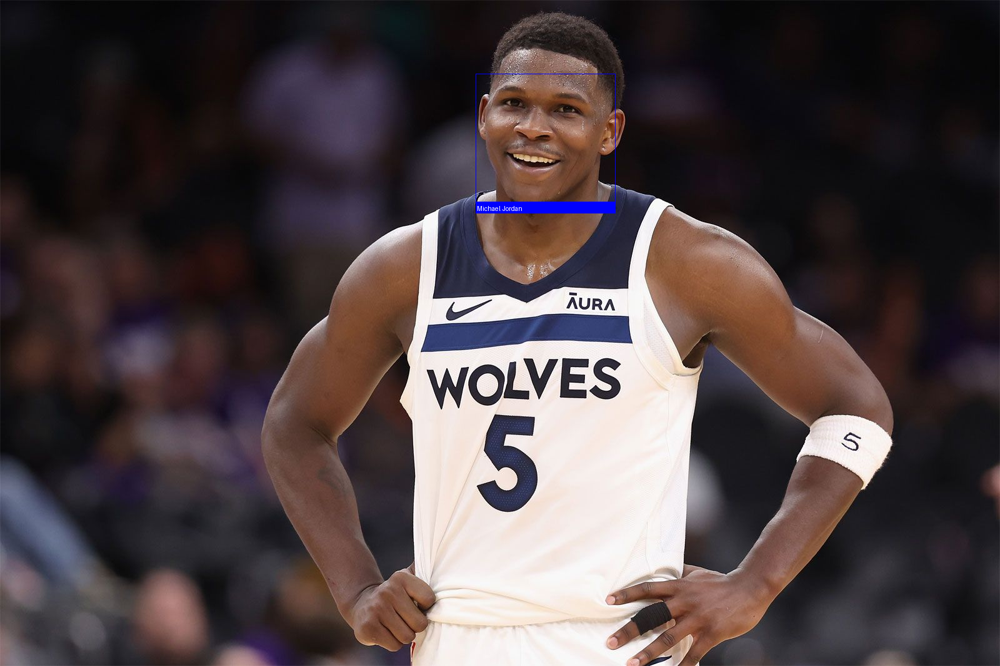

In [48]:
ant_man_image = download_image_from_web(
    "https://cdn.britannica.com/57/258357-050-796B2EB0/anthony-edwards-of-minnesota-timberwolves-at-first-round-playoffs-2024.jpg",
    False
)
jordan_image = download_image_from_web(
    "https://cdn.nba.com/headshots/nba/latest/1040x760/893.png",
)
images = {
    "Michael Jordan": jordan_image
}
recognize_faces(images, ant_man_image)

Wow! so the model actually thinks that Anthony Edwards looks a lot like Michael Jordan too, albeit this was on the verge of the confidence interval, and we could lower the maximum euclidean distance to prevent false positive cases like this.

#### Test 5: Blurred and flipped images

We'll flip and blur an image in order to reduce its quality. In this opportunity, we'll use images from former german prime minister Angela Merkel.
In order to see the effects of each transformation, we'll try them out one at a time, and if possible the two together.

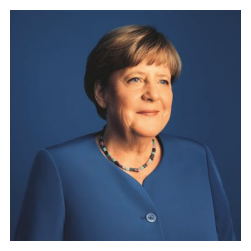

Found a match for Angela Merkel with distance 0.574


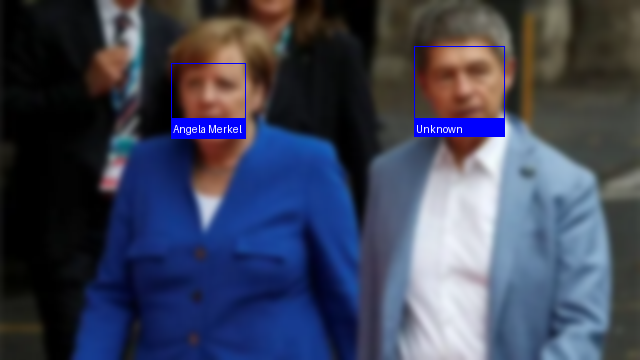

In [ ]:
merkel_image = download_image_from_web(
    "https://www.rbalibros.com/medio/2024/09/21/angela-merkel_3f080062_370x370.jpg",
)
merkel_blurred_image = download_image_from_web(
    url="https://ichef.bbci.co.uk/ace/ws/640/cpsprodpb/118C3/production/_96857817_mediaitem96857816.jpg.webp",
    display_image=False,
    flip=False,
    flip_angle=180,
    blur=True,
    blur_radius=3
)
images = {
    "Angela Merkel": merkel_image
}
recognize_faces(images, merkel_blurred_image, tolerance=0.6)

The model managed to recognize Angela Merkel and identify the second person, even though the blurred image made it hard to do so. Let's try by fliping the image this time:

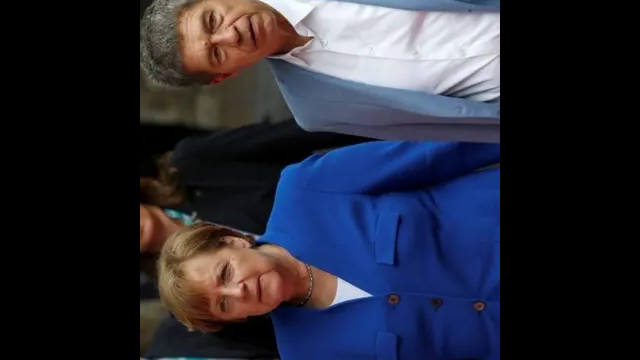

In [ ]:
merkel_flipped_image = download_image_from_web(
    url="https://ichef.bbci.co.uk/ace/ws/640/cpsprodpb/118C3/production/_96857817_mediaitem96857816.jpg.webp",
    display_image=False,
    flip=True,
    flip_angle=90,
    blur=False,
    blur_radius=3
)
recognize_faces(images, merkel_flipped_image, tolerance=0.6)

By flipping the image just a little (90°), the model wasn't able to even recognize either of the faces, which is another weakpoint we can add to it. If it can't even work on a small flip, there's no point in testing blurring and flipping together.

-----
### Final Thoughts

The `face-recognition` package is one of many open-source face recognition packages out there. I found their documentation to be very easy to understand and use, and the model to perform reasonably well on test data, as we saw previously.

To recap, some of its weaknesses were not identifying incomplete or flipped faces in images, and false positives on lookalike people. We can let the Clint Eastwood situation slide, as it's objectively hard for humans as well to tell if two pictures of that type effectively belong to the same person.
* **Flipped faces**: I think this is a problem that could be easily solved by introducing controlled, random noise in the model's training dataset with data augmentation. This way, the model can learn to also identify faces that are upside down without major changes to its loss function or other key structure parameters. It is unclear, however, if the next step (landmark detection) is also robust enough to align an upside-down image.
* **Incomplete faces**: While the model could also learn to identify incomplete faces by providing examples in the training data, it would still be challenging to extract a complete set of landmarks from a partial face. A different, more robust method would have to be used, perhaps recreating the missing landmarks assuming facial simmetry of something similar.
* **Lookalike people***: The easiest solution for this would be to lower the maximum accepted confidence threshold for face recognition, but this would also cause other problems, like not recognizing people properly on difficult images. This looks like a weakpoint in the second part of the algorithm, and perhaps a system with more points or a final embedding or more dimensions could capture more information about a person's face, that ultimately would lead to properly distinguishing two similar but different people.

---------------

This is all for now, thank you for your time!